In [1]:
import rospy
from sensor_msgs.msg import Image
from cv_bridge import CvBridge
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from std_msgs.msg import Float64
from dynamixel_sdk import *
import datetime
import threading
import serial
import re
import pandas as pd
import glob


In [2]:
from IPython.core.display import display, HTML
display(HTML("<style>div.output_scroll { height: 44em; }</style>"))

/tmp/ipykernel_39428/2284580335.py:1: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [3]:
%%javascript

window.scroll_flag = true
window.scroll_exit = false
window.scroll_delay = 100

$(".output_scroll").each(function() {
    $(this)[0].scrollTop = $(this)[0].scrollHeight;
});

function callScrollToBottom() {
    setTimeout(scrollToBottom, window.scroll_delay);
}

function scrollToBottom() {
    if (window.scroll_exit) {
        return;
    }
    if (!window.scroll_flag) {
        callScrollToBottom();
        return;
    };
    
    $(".output_scroll").each(function() {
        if (!$(this).attr('scroll_checkbox')){
            window.scroll_flag = true;
            $(this).attr('scroll_checkbox',true);
            var div = document.createElement('div');
            var checkbox = document.createElement('input');
            checkbox.type = "checkbox";
            checkbox.onclick = function(){window.scroll_flag = checkbox.checked}
            checkbox.checked = "checked"
            div.append("Auto-Scroll-To-Bottom: ");
            div.append(checkbox);
            $(this).parent().before(div);
        }
        
        $(this)[0].scrollTop = $(this)[0].scrollHeight;
    });
    callScrollToBottom();
}
scrollToBottom();

<IPython.core.display.Javascript object>

In [4]:
class Dynamixel_motor:
    def __init__(self, dxl_id, baudrate, device_name):
        self.dxl_id = dxl_id
        self.baudrate = baudrate
        self.device_name = device_name
        self.protocol_version = 2.0

        # Initialize PortHandler instance
        # Set the port path
        # Get methods and members of PortHandlerLinux or PortHandlerWindows
        self.portHandler = PortHandler(self.device_name)

        # Initialize PacketHandler instance
        # Set the protocol version
        # Get methods and members of Protocol1PacketHandler or Protocol2PacketHandler
        self.packetHandler = PacketHandler(self.protocol_version)

        # Open port
        if self.portHandler.openPort():
            print("Succeeded to open the port")
        else:
            print("Failed to open the port")
            print("Press any key to terminate...")
            self.close_port()

        # Set port baudrate
        if self.portHandler.setBaudRate(self.baudrate):
            print("Succeeded to change the baudrate")
        else:
            print("Failed to change the baudrate")
            print("Press any key to terminate...")
            self.close_port()

    def __del__(self):
        print('Destructor called.')
        self.portHandler.closePort()

    def close_port(self):
        self.torque_disable()
        self.portHandler.closePort()
        print('closing port.')

    def ping_motor(self):

        # Try to ping the Dynamixel
        # Get Dynamixel model number
        dxl_model_number, dxl_comm_result, dxl_error = self.packetHandler.ping(self.portHandler, self.dxl_id)
        print(f"dxl_model_number is: {dxl_model_number}")
        print(f"dxl_comm_result is: {dxl_comm_result}")
        print(f"dxl_error is: {dxl_error}")
        print(f"COMM_SUCCESS is {COMM_SUCCESS}")
        if dxl_comm_result != COMM_SUCCESS:
            print("statement 0")
            print("%s" % self.packetHandler.getTxRxResult(dxl_comm_result))
            self.close_port()
        elif dxl_error != 0:
            print("statement 1")
            print("%s" % self.packetHandler.getRxPacketError(dxl_error))
            self.close_port()
        else:
            print("statement 2")
            print("[ID:%03d] ping Succeeded. Dynamixel model number : %d" % (self.dxl_id, dxl_model_number))

    def torque_enable(self):
        TORQUE_ENABLE_REG = 64
        TORQUE_ENABLE = 1
        result, error = self.packetHandler.write4ByteTxRx(self.portHandler, self.dxl_id, TORQUE_ENABLE_REG, TORQUE_ENABLE)
        return

    def torque_disable(self):
        TORQUE_ENABLE_REG = 64
        TORQUE_ENABLE = 0
        result, error = self.packetHandler.write4ByteTxRx(self.portHandler, self.dxl_id, TORQUE_ENABLE_REG, TORQUE_ENABLE)
        return

    def read_operation_mode(self):
        OPERATING_MODE_REG = 11
        data, result, error = self.packetHandler.read1ByteTxRx(self.portHandler, self.dxl_id, OPERATING_MODE_REG)
        print(f"data is: {data}")
        print(f"result is: {result}")
        print(f"error is: {error}")
        return data

    def set_current_position_mode(self):
        OPERATING_MODE_REG = 11
        OPERATION_MODE = 5
        result, error = self.packetHandler.write1ByteTxRx(self.portHandler, self.dxl_id, OPERATING_MODE_REG, OPERATION_MODE)
        return

    def set_goal_current(self, GOAL_CURRENT):
        GOAL_CURRENT_REG = 102
        result, error = self.packetHandler.write2ByteTxRx(self.portHandler, self.dxl_id, GOAL_CURRENT_REG, GOAL_CURRENT)
        return

    def read_present_position(self):
        PRESENT_POSITION_REG = 132
        PRESENT_POSITION, result, error = self.packetHandler.read4ByteTxRx(self.portHandler, self.dxl_id, PRESENT_POSITION_REG)
        return PRESENT_POSITION

    def set_goal_position(self, GOAL_POSITION):
        GOAL_POSITION_REG = 116
        result, error = self.packetHandler.write4ByteTxRx(self.portHandler, self.dxl_id, GOAL_POSITION_REG, GOAL_POSITION)
        return

    def read_present_current(self):
        PRESENT_CURRENT_REG = 126
        PRESENT_CURRENT, result, error = self.packetHandler.read2ByteTxRx(self.portHandler, self.dxl_id, PRESENT_CURRENT_REG)
        return PRESENT_CURRENT


Succeeded to open the port
Succeeded to change the baudrate
data is: 5
result is: 0
error is: 0
[INFO] [1677465075.197984]: Timing images
Enter something: 
b'000.0,000.0,0000.0,000-0.0\r\n'
[INFO] [1677465084.751290]: Image received...


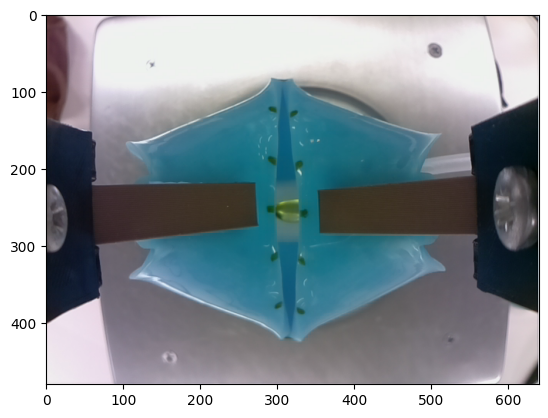

b'015.9,018.9,0109.4,0109.5\r\n'
Data number 1
['015.9', '018.9', '0109.4', '0109.5']
b'016.1,020.8,0170.8,0047.1\r\n'
['016.1', '020.8', '0170.8', '0047.1']
Enter something: 
b'000.0,000.0,0000.3,0000.1\r\n'
[INFO] [1677465104.494764]: Image received...


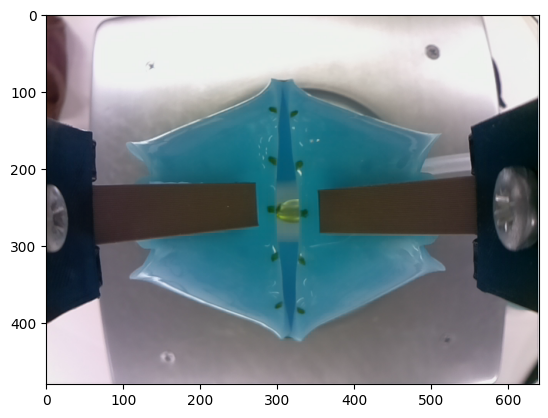

b'016.9,020.5,0119.5,0119.8\r\n'
Data number 2
['016.9', '020.5', '0119.5', '0119.8']
b'017.2,021.3,0181.5,0057.7\r\n'
['017.2', '021.3', '0181.5', '0057.7']
Enter something: 
b'000.0,000.0,0000.2,0000.4\r\n'
[INFO] [1677465119.999435]: Image received...


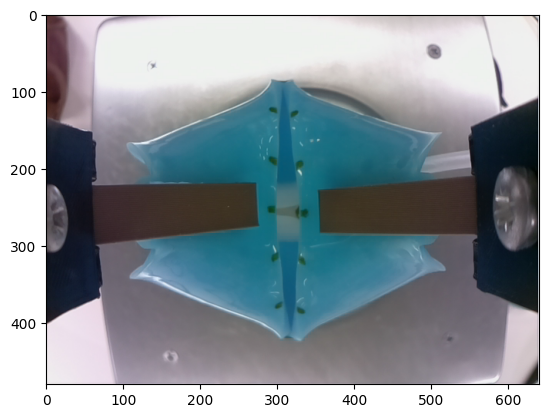

b'014.9,021.4,0122.9,0123.6\r\n'
Data number 3
['014.9', '021.4', '0122.9', '0123.6']
b'015.2,023.3,0186.4,0062.8\r\n'
['015.2', '023.3', '0186.4', '0062.8']
Enter something: 
b'000.0,000.0,0000.0,0000.1\r\n'
[INFO] [1677465145.501714]: Image received...


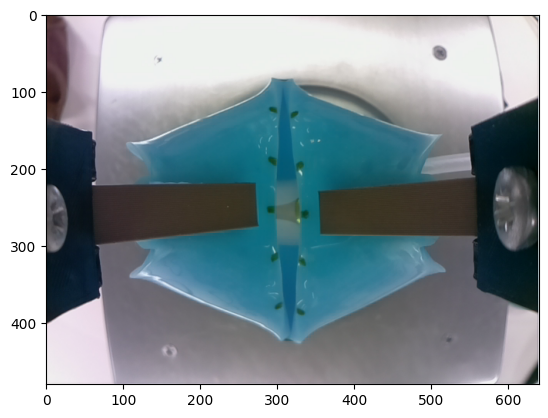

b'026.6,031.3,0125.1,0125.0\r\n'
Data number 4
['026.6', '031.3', '0125.1', '0125.0']
b'027.8,032.8,0186.1,0062.2\r\n'
['027.8', '032.8', '0186.1', '0062.2']
Enter something: 
b'000.0,000.0,0001.0,0001.1\r\n'
[INFO] [1677465158.003456]: Image received...


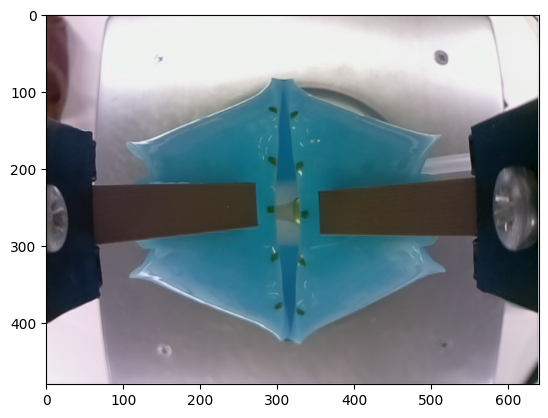

b'026.7,030.7,0142.1,0142.0\r\n'
Data number 5
['026.7', '030.7', '0142.1', '0142.0']
b'028.1,032.6,0205.1,0080.8\r\n'
['028.1', '032.6', '0205.1', '0080.8']
Enter something: 
b'000.0,000.0,0000.6,0000.7\r\n'
[INFO] [1677465171.996121]: Image received...


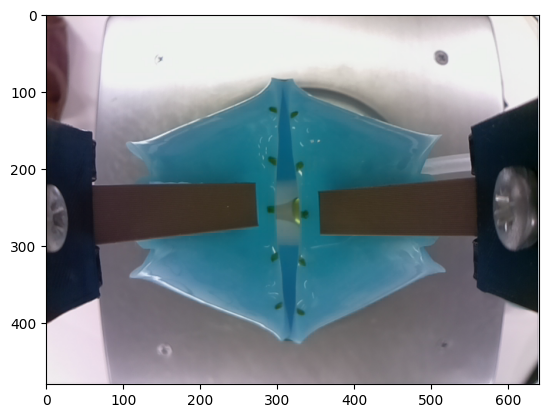

b'026.1,030.4,0138.1,0138.4\r\n'
Data number 6
['026.1', '030.4', '0138.1', '0138.4']
b'027.2,032.7,0200.5,0076.5\r\n'
['027.2', '032.7', '0200.5', '0076.5']
Enter something: 
b'000.0,000.0,0000.4,0000.4\r\n'
[INFO] [1677465187.504848]: Image received...


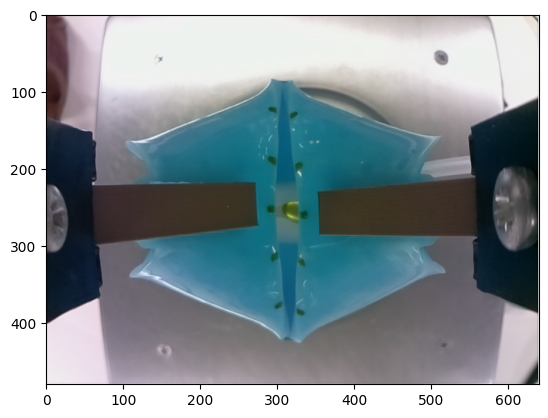

b'018.2,023.3,0129.9,0130.2\r\n'
Data number 7
['018.2', '023.3', '0129.9', '0130.2']
b'018.6,025.9,0191.9,0068.2\r\n'
['018.6', '025.9', '0191.9', '0068.2']
Enter something: 
b'000.0,000.0,0000.6,0000.5\r\n'
[INFO] [1677465201.746721]: Image received...


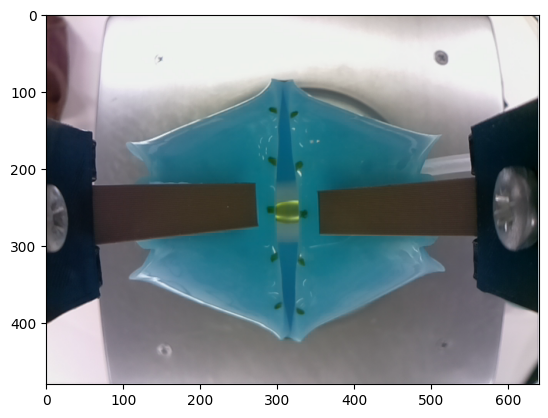

b'016.0,019.4,0133.6,0134.1\r\n'
Data number 8
['016.0', '019.4', '0133.6', '0134.1']
b'016.4,020.1,0196.5,0072.5\r\n'
['016.4', '020.1', '0196.5', '0072.5']
Enter something: 
b'000.0,000.0,0000.6,0000.6\r\n'
[INFO] [1677465215.995627]: Image received...


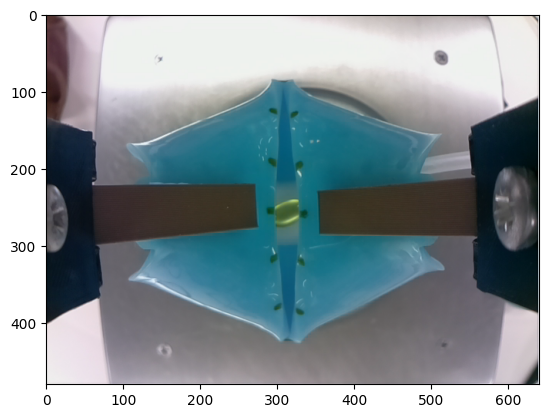

b'021.1,023.1,0135.9,0136.1\r\n'
Data number 9
['021.1', '023.1', '0135.9', '0136.1']
b'021.8,023.8,0198.3,0074.6\r\n'
['021.8', '023.8', '0198.3', '0074.6']
Enter something: 
b'000.0,000.0,0000.0,0000.2\r\n'
[INFO] [1677465242.752265]: Image received...


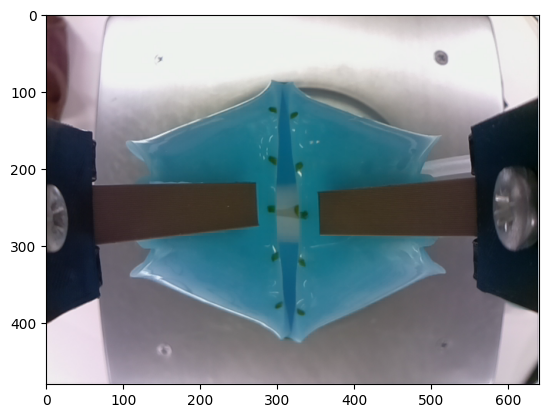

b'019.6,024.9,0121.2,0121.7\r\n'
Data number 10
['019.6', '024.9', '0121.2', '0121.7']
b'021.6,027.3,0181.9,0058.4\r\n'
['021.6', '027.3', '0181.9', '0058.4']
Enter something: 
b'000.0,000.0,0000.1,0000.1\r\n'
[INFO] [1677465261.498450]: Image received...


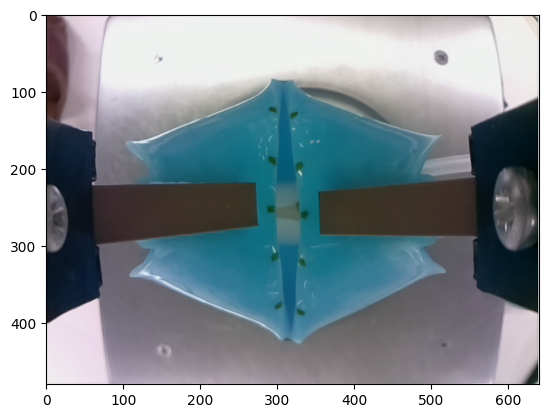

b'025.5,029.0,0126.4,0127.0\r\n'
Data number 11
['025.5', '029.0', '0126.4', '0127.0']
b'028.7,031.6,0187.0,0063.1\r\n'
['028.7', '031.6', '0187.0', '0063.1']
Enter something: 
b'000.0,000.0,0000.3,0000.3\r\n'
[INFO] [1677465278.005290]: Image received...


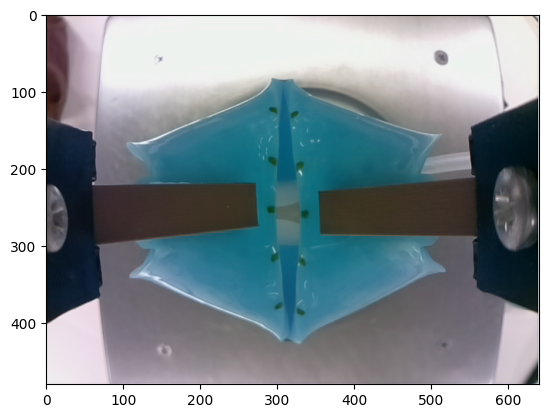

b'025.5,031.6,0131.3,0131.6\r\n'
Data number 12
['025.5', '031.6', '0131.3', '0131.6']
b'027.6,033.3,0193.6,0069.7\r\n'
['027.6', '033.3', '0193.6', '0069.7']
Enter something: 
b'000.0,000.0,0000.1,0000.2\r\n'
[INFO] [1677465297.252384]: Image received...


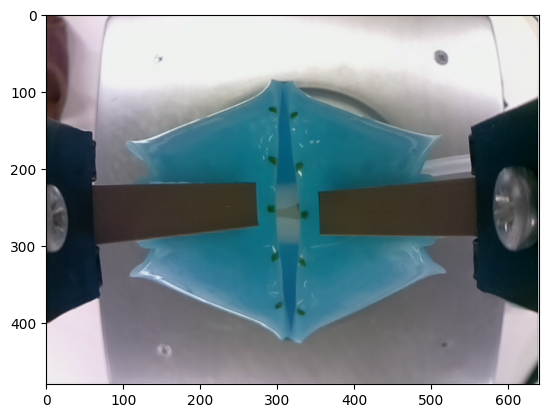

b'023.5,027.4,0125.2,0126.1\r\n'
Data number 13
['023.5', '027.4', '0125.2', '0126.1']
b'026.7,030.1,0185.6,0061.9\r\n'
['026.7', '030.1', '0185.6', '0061.9']
Enter something: 
b'000.0,000.0,0000.5,0000.5\r\n'
[INFO] [1677465311.483316]: Image received...


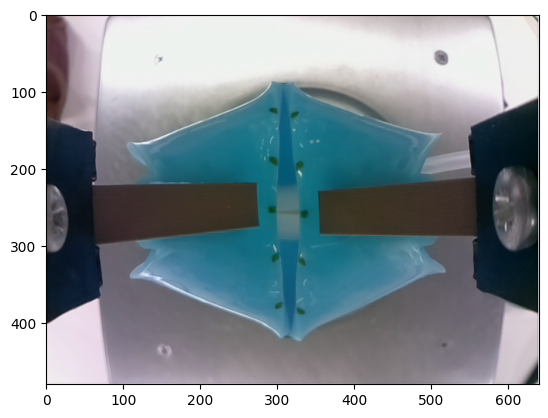

b'010.7,019.4,0127.0,0127.8\r\n'
Data number 14
['010.7', '019.4', '0127.0', '0127.8']
b'011.7,021.8,0191.4,0067.9\r\n'
['011.7', '021.8', '0191.4', '0067.9']
Enter something: 
b'000.0,000.0,0000.5,0000.6\r\n'
[INFO] [1677465325.750203]: Image received...


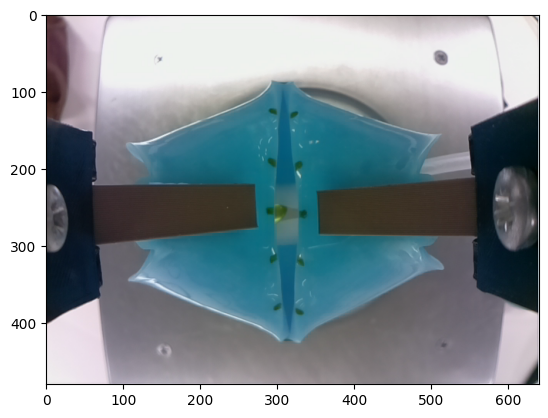

b'020.8,022.0,0134.8,0134.8\r\n'
Data number 15
['020.8', '022.0', '0134.8', '0134.8']
b'022.4,022.9,0195.4,0071.2\r\n'
['022.4', '022.9', '0195.4', '0071.2']
Enter something: 
b'000.0,000.0,0001.9,0001.3\r\n'
[INFO] [1677465338.503681]: Image received...


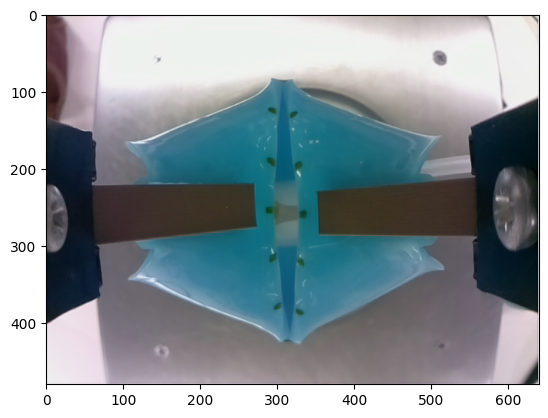

b'026.8,025.4,0147.9,0147.7\r\n'
Data number 16
['026.8', '025.4', '0147.9', '0147.7']
b'026.8,026.2,0208.8,0084.4\r\n'
['026.8', '026.2', '0208.8', '0084.4']
Enter something: 
b'000.0,000.0,0000.0,0000.1\r\n'
[INFO] [1677465394.983831]: Image received...


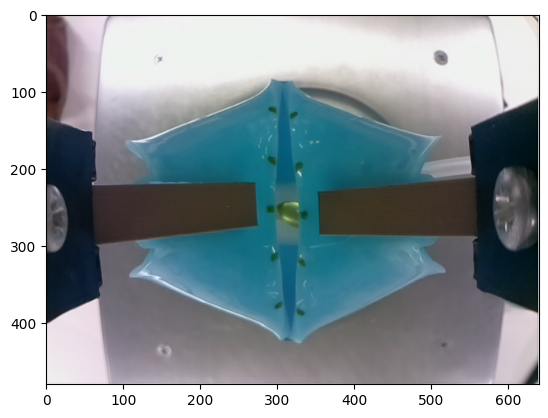

b'023.3,026.9,0119.1,0119.5\r\n'
Data number 17
['023.3', '026.9', '0119.1', '0119.5']
b'023.8,029.0,0178.1,0054.4\r\n'
['023.8', '029.0', '0178.1', '0054.4']
Enter something: 
b'000.0,000.0,0000.8,0000.9\r\n'
[INFO] [1677465408.252534]: Image received...


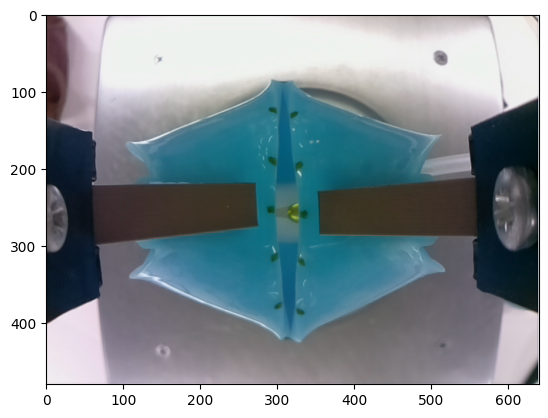

b'015.4,021.8,0134.0,0134.0\r\n'
Data number 18
['015.4', '021.8', '0134.0', '0134.0']
b'016.0,023.6,0197.4,0073.6\r\n'
['016.0', '023.6', '0197.4', '0073.6']
Enter something: 
b'000.0,000.0,0000.1,0000.1\r\n'
[INFO] [1677465469.510068]: Image received...


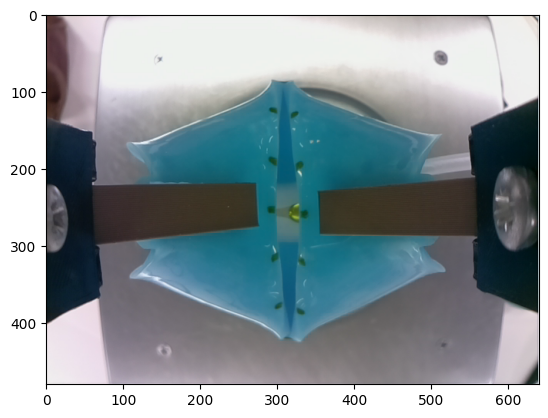

b'015.7,022.7,0116.0,0116.5\r\n'
Data number 19
['015.7', '022.7', '0116.0', '0116.5']
b'015.9,024.3,0177.5,0053.7\r\n'
['015.9', '024.3', '0177.5', '0053.7']
Enter something: 
b'000.0,000.0,0000.0,0000.1\r\n'
[INFO] [1677465493.004927]: Image received...


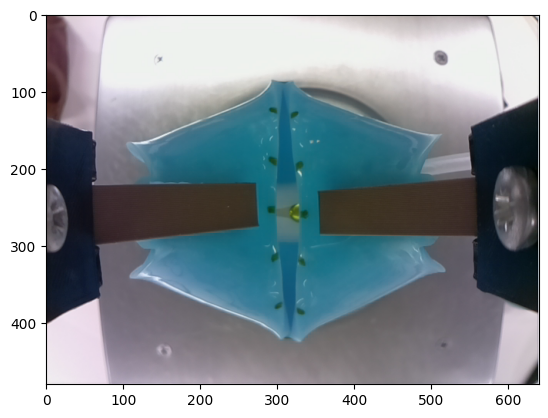

b'015.0,021.9,0119.0,0119.6\r\n'
Data number 20
['015.0', '021.9', '0119.0', '0119.6']
b'015.2,024.0,0180.9,0057.2\r\n'
['015.2', '024.0', '0180.9', '0057.2']
Enter something: 
b'000.0,000.0,0000.6,0000.6\r\n'
[INFO] [1677465506.522034]: Image received...


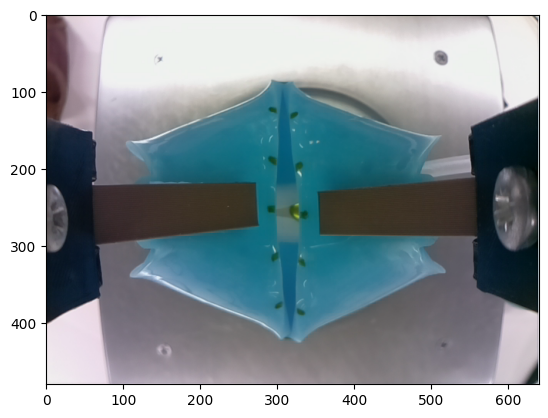

b'017.2,023.7,0131.2,0131.5\r\n'
Data number 21
['017.2', '023.7', '0131.2', '0131.5']
b'017.9,026.3,0194.0,0070.5\r\n'
['017.9', '026.3', '0194.0', '0070.5']
Enter something: 
b'000.0,000.0,0000.6,0000.7\r\n'
[INFO] [1677465520.491286]: Image received...


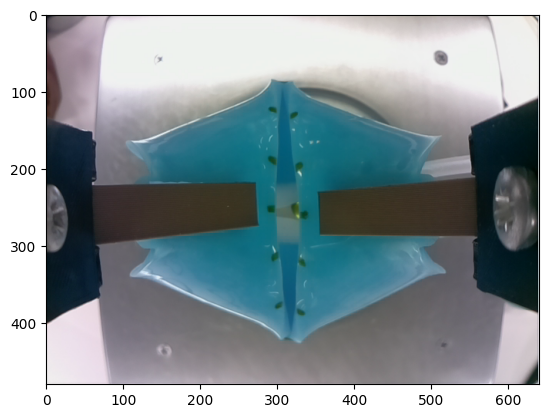

b'022.2,026.7,0133.9,0133.8\r\n'
Data number 22
['022.2', '026.7', '0133.9', '0133.8']
b'024.1,029.0,0195.5,0071.5\r\n'
['024.1', '029.0', '0195.5', '0071.5']
Enter something: 
b'000.0,000.0,0002.0,0001.1\r\n'
[INFO] [1677465533.014040]: Image received...


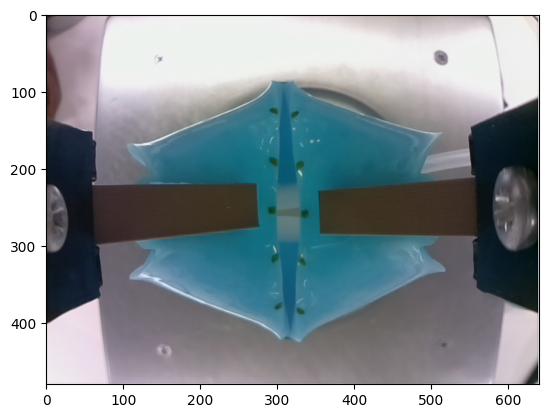

b'012.5,023.5,0139.8,0139.4\r\n'
Data number 23
['012.5', '023.5', '0139.8', '0139.4']
b'013.7,025.1,0205.0,0080.7\r\n'
['013.7', '025.1', '0205.0', '0080.7']
Enter something: 
b'000.0,000.0,0000.2,0000.2\r\n'
[INFO] [1677465550.777341]: Image received...


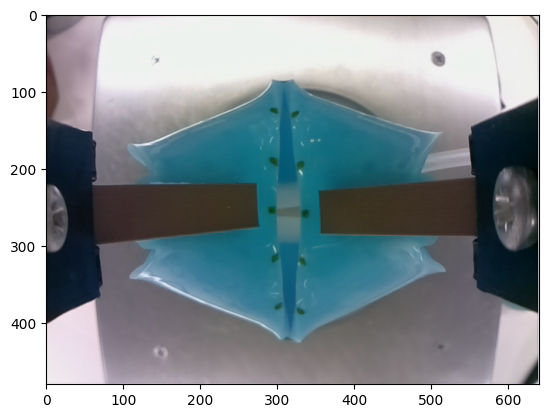

b'014.9,027.1,0128.7,0129.0\r\n'
Data number 24
['014.9', '027.1', '0128.7', '0129.0']
b'016.3,029.3,0192.9,0069.2\r\n'
['016.3', '029.3', '0192.9', '0069.2']
Enter something: 
b'000.0,000.0,0000.3,0000.3\r\n'
[INFO] [1677465567.766248]: Image received...


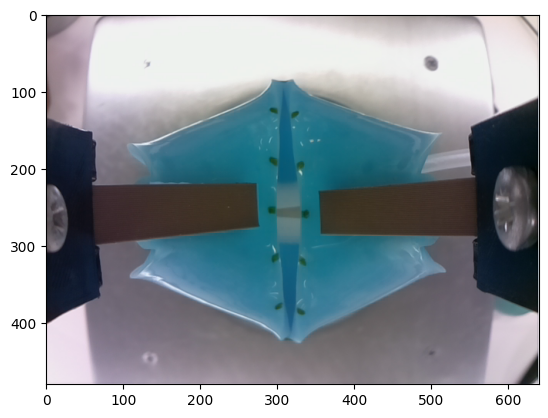

b'016.4,028.1,0130.4,0130.8\r\n'
Data number 25
['016.4', '028.1', '0130.4', '0130.8']
b'019.3,029.8,0193.8,0070.2\r\n'
['019.3', '029.8', '0193.8', '0070.2']
Enter something: 
b'000.0,000.0,0000.3,0000.3\r\n'
[INFO] [1677465584.759356]: Image received...


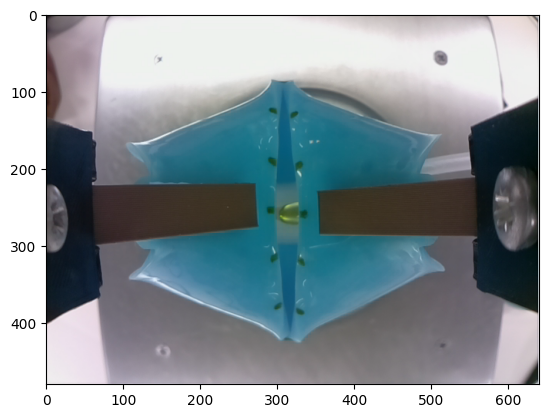

b'015.9,021.4,0128.7,0128.9\r\n'
Data number 26
['015.9', '021.4', '0128.7', '0128.9']
b'016.1,023.1,0191.2,0067.4\r\n'
['016.1', '023.1', '0191.2', '0067.4']
Enter something: 
b'000.0,000.0,0000.2,0000.1\r\n'
[INFO] [1677465605.500632]: Image received...


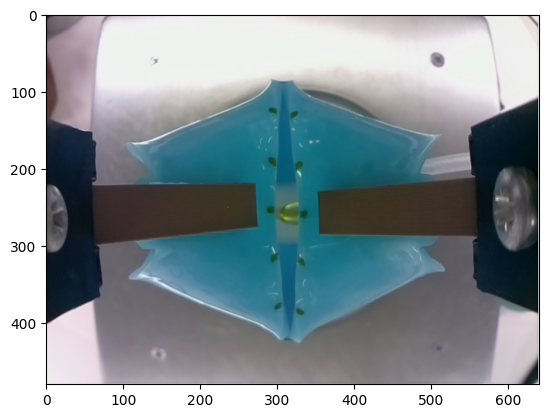

b'015.9,020.8,0125.2,0125.4\r\n'
Data number 27
['015.9', '020.8', '0125.2', '0125.4']
b'016.0,022.2,0187.6,0063.7\r\n'
['016.0', '022.2', '0187.6', '0063.7']
Enter something: 
b'000.0,000.0,0000.3,0000.3\r\n'
[INFO] [1677465621.513362]: Image received...


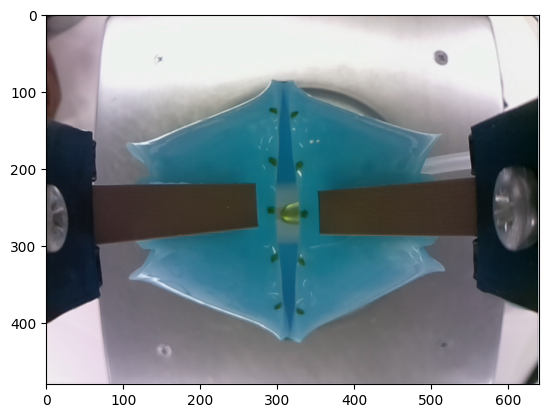

b'016.2,021.1,0129.7,0129.8\r\n'
Data number 28
['016.2', '021.1', '0129.7', '0129.8']
b'016.6,022.2,0192.5,0068.6\r\n'
['016.6', '022.2', '0192.5', '0068.6']
Enter something: 
b'000.0,000.0,0000.0,0000.1\r\n'
[INFO] [1677465657.494038]: Image received...


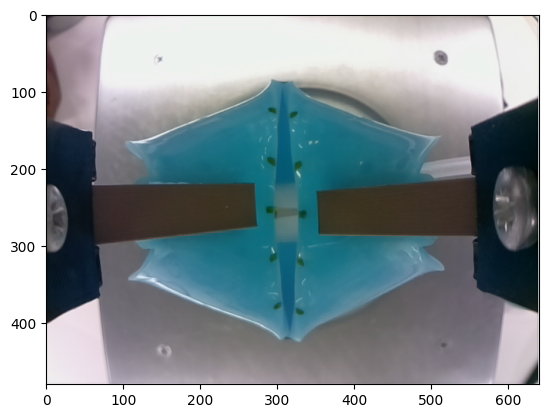

b'013.7,015.6,0120.4,0120.2\r\n'
Data number 29
['013.7', '015.6', '0120.4', '0120.2']
b'012.9,015.5,0179.3,0055.5\r\n'
['012.9', '015.5', '0179.3', '0055.5']
Enter something: 
b'000.0,000.0,0000.1,0000.2\r\n'
[INFO] [1677465676.262865]: Image received...


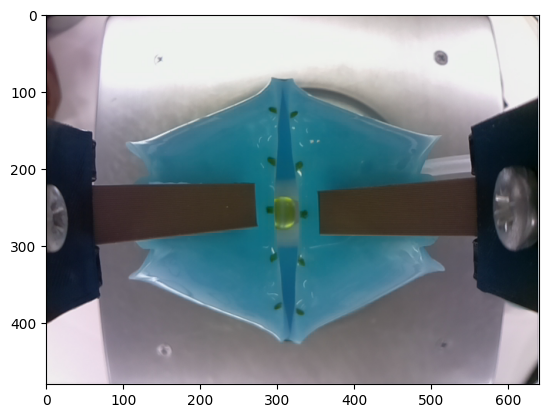

b'027.5,028.1,0131.1,0131.3\r\n'
Data number 30
['027.5', '028.1', '0131.1', '0131.3']
b'026.9,028.5,0192.5,0068.5\r\n'
['026.9', '028.5', '0192.5', '0068.5']
Enter something: 
b'000.0,000.0,0000.1,0000.1\r\n'
[INFO] [1677465701.760263]: Image received...


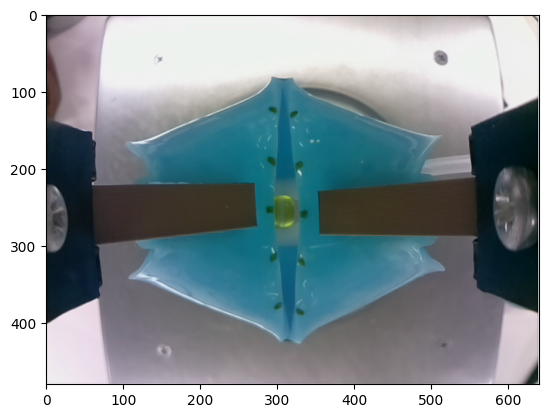

b'027.8,027.5,0129.2,0129.0\r\n'
Data number 31
['027.8', '027.5', '0129.2', '0129.0']
b'026.7,027.2,0189.3,0065.7\r\n'
['026.7', '027.2', '0189.3', '0065.7']
Enter something: 
b'000.0,000.0,0000.3,0000.3\r\n'
[INFO] [1677465717.032538]: Image received...


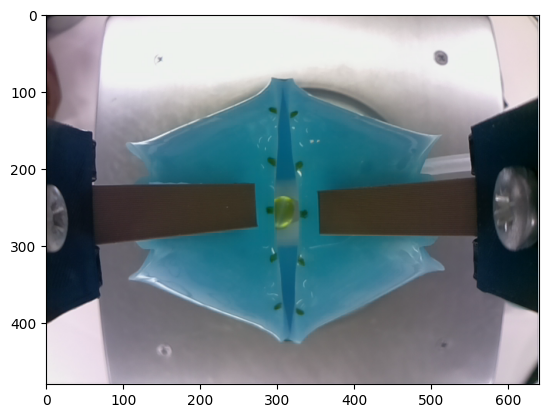

b'027.1,027.3,0135.9,0135.7\r\n'
Data number 32
['027.1', '027.3', '0135.9', '0135.7']
b'026.5,027.4,0197.3,0073.3\r\n'
['026.5', '027.4', '0197.3', '0073.3']
Enter something: 
b'000.0,000.0,0000.1,0000.3\r\n'
[INFO] [1677465735.245147]: Image received...


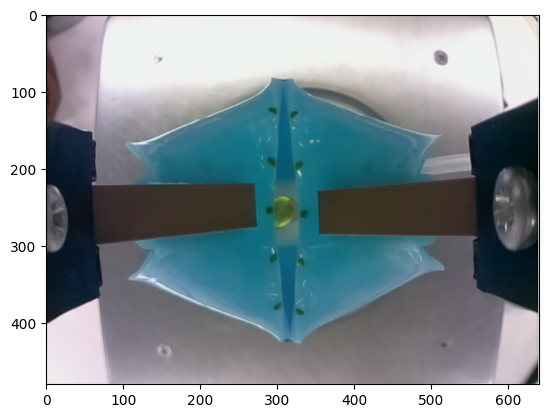

b'026.8,026.2,0132.5,0132.4\r\n'
Data number 33
['026.8', '026.2', '0132.5', '0132.4']
b'026.4,026.8,0193.6,0069.9\r\n'
['026.4', '026.8', '0193.6', '0069.9']
Enter something: 
b'000.0,000.0,0000.1,0000.1\r\n'
[INFO] [1677465755.269596]: Image received...


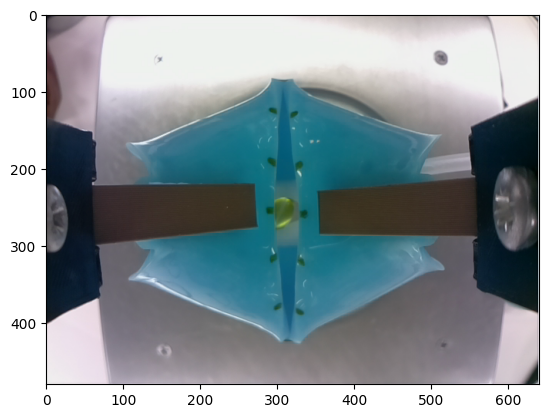

b'026.7,026.6,0130.3,0130.5\r\n'
Data number 34
['026.7', '026.6', '0130.3', '0130.5']
b'026.5,027.3,0190.7,0067.1\r\n'
['026.5', '027.3', '0190.7', '0067.1']
Enter something: 
b'000.0,000.0,0001.2,0001.2\r\n'
[INFO] [1677465768.012292]: Image received...


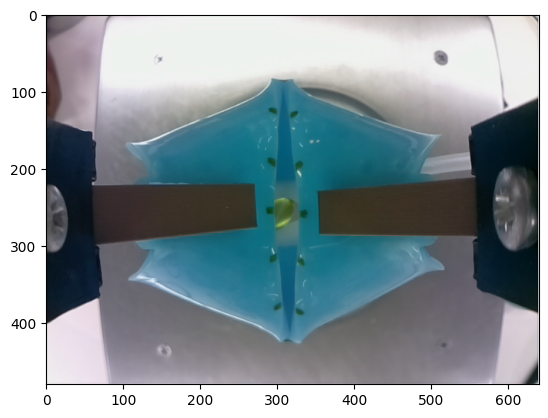

b'025.9,025.8,0145.9,0146.1\r\n'
Data number 35
['025.9', '025.8', '0145.9', '0146.1']
b'026.7,026.9,0207.6,0083.6\r\n'
['026.7', '026.9', '0207.6', '0083.6']
Enter something: 
b'000.0,000.0,0001.2,0001.2\r\n'
[INFO] [1677465780.770265]: Image received...


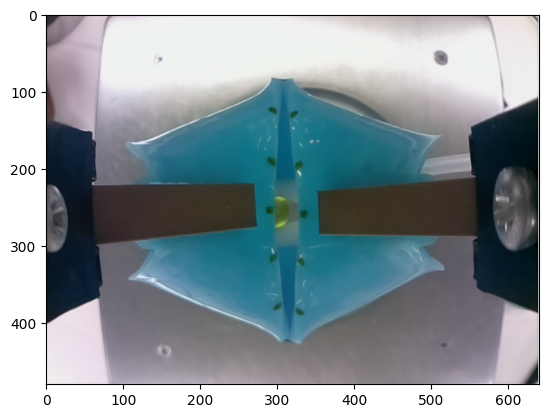

b'027.1,025.8,0149.8,0149.8\r\n'
Data number 36
['027.1', '025.8', '0149.8', '0149.8']
b'026.9,026.4,0211.8,0087.7\r\n'
['026.9', '026.4', '0211.8', '0087.7']
Enter something: 
b'000.0,000.0,0000.6,0000.6\r\n'
[INFO] [1677465794.512369]: Image received...


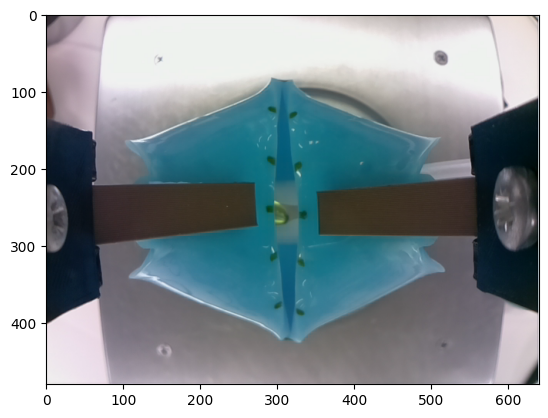

b'018.0,019.8,0140.2,0140.1\r\n'
Data number 37
['018.0', '019.8', '0140.2', '0140.1']
b'016.3,020.9,0201.7,0077.8\r\n'
['016.3', '020.9', '0201.7', '0077.8']
Enter something: 
b'000.0,000.0,0000.4,0000.4\r\n'
[INFO] [1677465810.013616]: Image received...


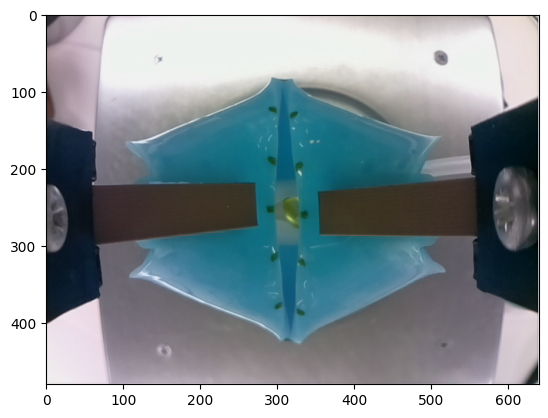

b'025.0,029.1,0139.0,0138.7\r\n'
Data number 38
['025.0', '029.1', '0139.0', '0138.7']
b'025.6,031.0,0200.5,0076.6\r\n'
['025.6', '031.0', '0200.5', '0076.6']
Enter something: 
b'000.0,000.0,0001.2,0000.9\r\n'
[INFO] [1677465822.772933]: Image received...


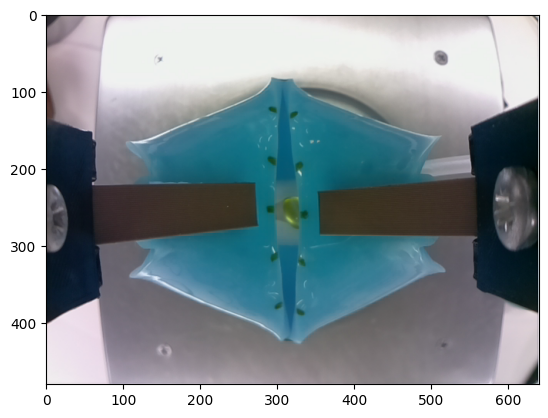

b'025.8,029.3,0147.7,0147.2\r\n'
Data number 39
['025.8', '029.3', '0147.7', '0147.2']
b'026.2,030.9,0210.5,0086.0\r\n'
['026.2', '030.9', '0210.5', '0086.0']
Enter something: 
b'000.0,000.0,0000.7,0000.6\r\n'
[INFO] [1677465836.747528]: Image received...


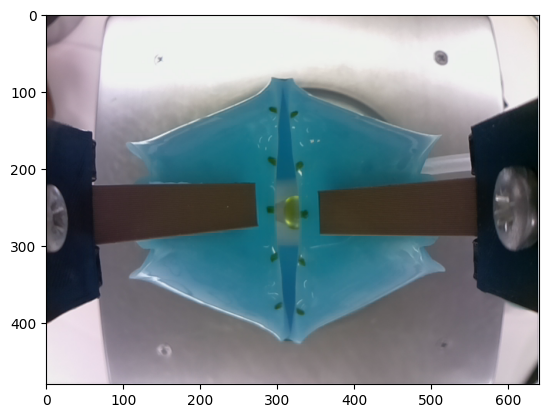

b'026.8,029.7,0143.5,0144.0\r\n'
Data number 40
['026.8', '029.7', '0143.5', '0144.0']
b'027.0,030.1,0207.1,0083.5\r\n'
['027.0', '030.1', '0207.1', '0083.5']
Enter something: 
b'000.0,000.0,000-0.1,0000.2\r\n'
[INFO] [1677465882.009473]: Image received...


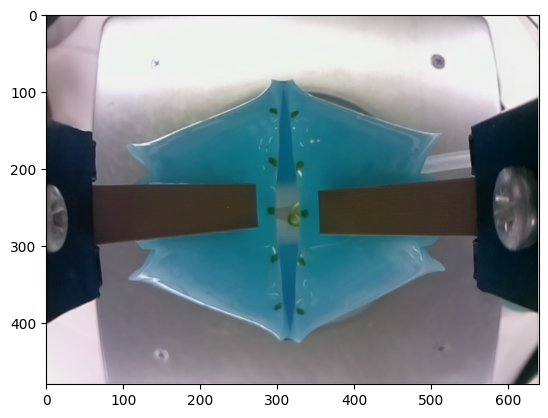

b'018.7,026.4,0122.7,0123.4\r\n'
Data number 41
['018.7', '026.4', '0122.7', '0123.4']
b'019.7,026.8,0184.4,0061.6\r\n'
['019.7', '026.8', '0184.4', '0061.6']
Enter something: 
b'000.0,000.0,0001.3,0000.9\r\n'
[INFO] [1677465895.265578]: Image received...


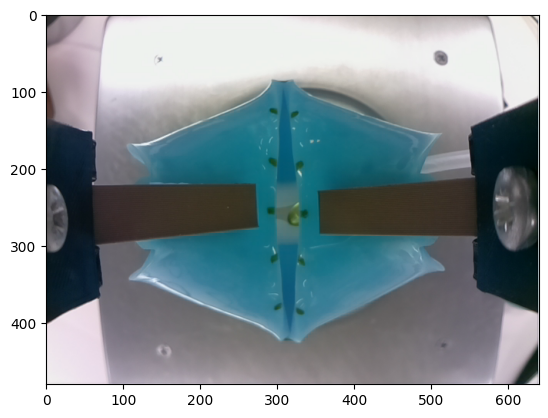

b'017.5,025.2,0137.4,0137.3\r\n'
Data number 42
['017.5', '025.2', '0137.4', '0137.3']
b'018.6,026.1,0201.2,0077.2\r\n'
['018.6', '026.1', '0201.2', '0077.2']
Enter something: 
b'000.0,000.0,0002.7,0002.5\r\n'
[INFO] [1677465907.022601]: Image received...


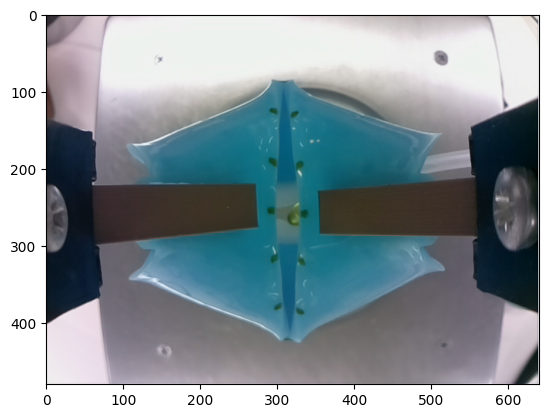

b'017.2,024.1,0152.9,0151.7\r\n'
Data number 43
['017.2', '024.1', '0152.9', '0151.7']
b'017.9,025.5,0217.7,0092.4\r\n'
['017.9', '025.5', '0217.7', '0092.4']
Enter something: 
b'000.0,000.0,0001.2,0001.2\r\n'
[INFO] [1677465919.767835]: Image received...


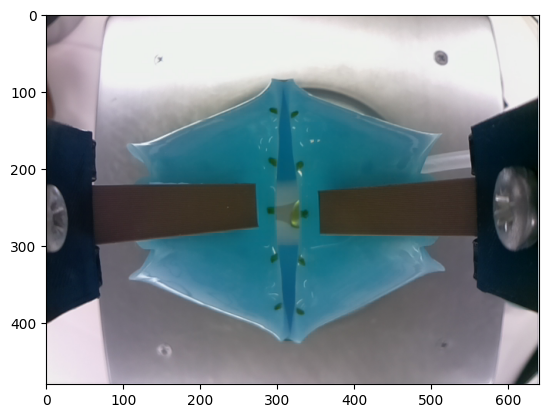

b'022.5,028.8,0147.8,0148.1\r\n'
Data number 44
['022.5', '028.8', '0147.8', '0148.1']
b'023.6,030.2,0211.8,0088.1\r\n'
['023.6', '030.2', '0211.8', '0088.1']
Enter something: 
b'000.0,000.0,0002.0,0001.9\r\n'
[INFO] [1677465932.016677]: Image received...


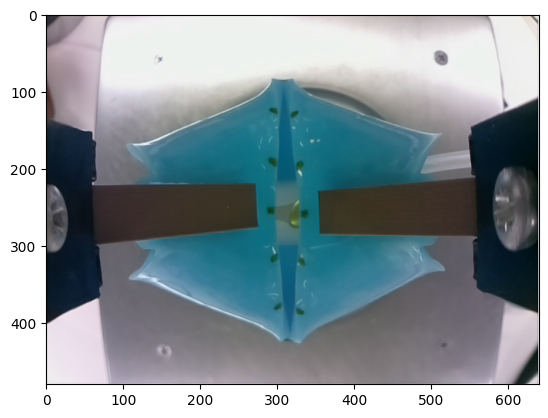

b'021.9,029.1,0154.2,0154.2\r\n'
Data number 45
['021.9', '029.1', '0154.2', '0154.2']
b'023.5,030.3,0218.6,0094.8\r\n'
['023.5', '030.3', '0218.6', '0094.8']
Enter something: 
b'000.0,000.0,0000.9,0001.0\r\n'
[INFO] [1677465945.019400]: Image received...


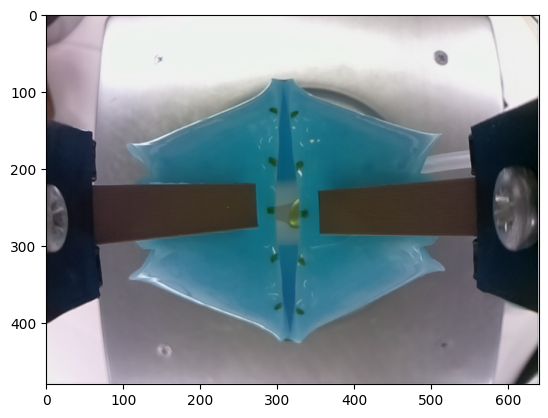

b'022.5,029.1,0145.9,0146.2\r\n'
Data number 46
['022.5', '029.1', '0145.9', '0146.2']
b'023.7,029.9,0210.1,0086.1\r\n'
['023.7', '029.9', '0210.1', '0086.1']
Enter something: 
b'000.0,000.0,0000.4,0000.3\r\n'
[INFO] [1677465961.000046]: Image received...


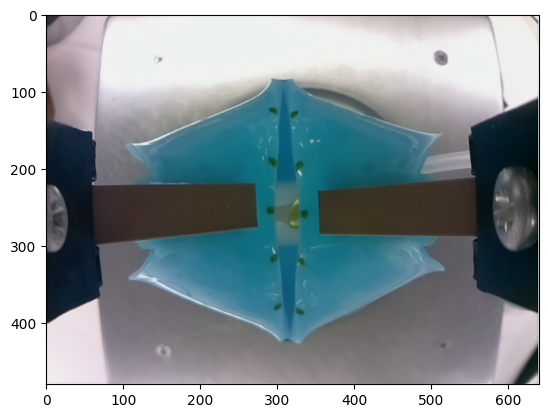

b'023.3,029.3,0138.2,0138.3\r\n'
Data number 47
['023.3', '029.3', '0138.2', '0138.3']
b'024.3,030.4,0201.0,0077.1\r\n'
['024.3', '030.4', '0201.0', '0077.1']
Enter something: 
b'000.0,000.0,0000.1,0000.1\r\n'
[INFO] [1677465983.511654]: Image received...


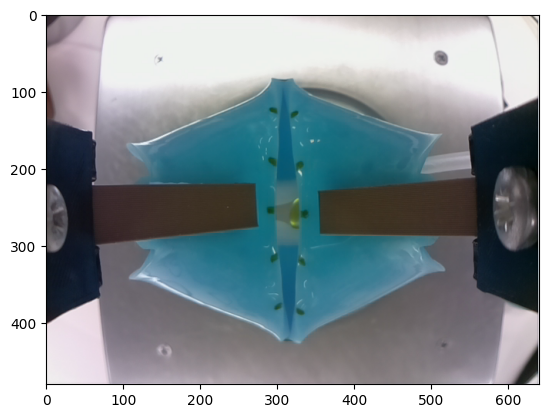

b'025.0,030.0,0131.5,0131.5\r\n'
Data number 48
['025.0', '030.0', '0131.5', '0131.5']
b'025.8,030.0,0193.7,0069.9\r\n'
['025.8', '030.0', '0193.7', '0069.9']
Enter something: 
b'000.0,000.0,0000.1,000-0.0\r\n'
[INFO] [1677466023.764720]: Image received...


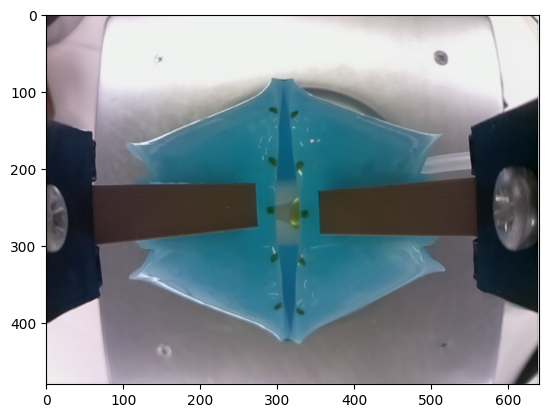

b'025.7,030.6,0126.7,0127.2\r\n'
Data number 49
['025.7', '030.6', '0126.7', '0127.2']
b'026.8,030.5,0188.5,0064.9\r\n'
['026.8', '030.5', '0188.5', '0064.9']
Enter something: 
b'000.0,000.0,000-0.0,0000.0\r\n'
[INFO] [1677466052.010256]: Image received...


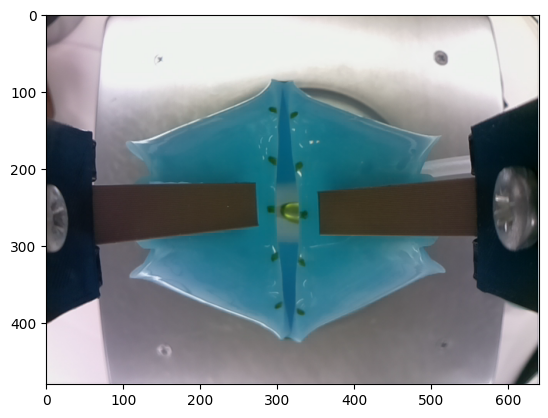

b'017.0,022.2,0122.5,0122.6\r\n'
Data number 50
['017.0', '022.2', '0122.5', '0122.6']
b'016.4,024.5,0183.8,0059.9\r\n'
['016.4', '024.5', '0183.8', '0059.9']
Enter something: 
b'000.0,000.0,0000.9,0000.5\r\n'
[INFO] [1677466066.271873]: Image received...


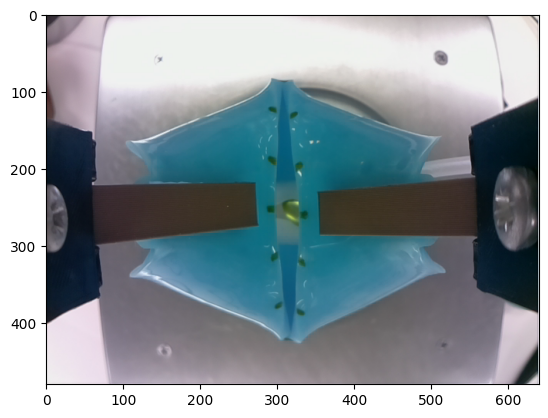

b'022.7,027.6,0135.7,0135.6\r\n'
Data number 51
['022.7', '027.6', '0135.7', '0135.6']
b'023.4,030.1,0197.0,0073.0\r\n'
['023.4', '030.1', '0197.0', '0073.0']


In [5]:
class Nodo(object):
    def __init__(self, dxl_motor):
        
        self.state = 0
        
        self.input_thread = threading.Thread(target=self.get_input)
        self.input_thread.daemon = True
        self.input_thread.start()
        
        self.image_array = []
        self.pressure_reading_1 = []
        self.pressure_reading_2 = []
        self.force_reading_1 = []
        self.force_reading_2 = []
        self.weight_reading_1 = []
        self.weight_reading_2 = []
        
        self.command = '0'
        self.take_photo = '0'
        self.dxl_motor = dxl_motor
        self.initialise_motor()
        
        self.ser = serial.Serial('/dev/ttyACM0', 57600, timeout=1)
        self.initialise_arduino()
        
        self.br = CvBridge()

        self.loop_rate = rospy.Rate(4)

        # Publishers
        self.pub = rospy.Publisher('number_command', Float64, queue_size=10)

        # Subscribers
        rospy.Subscriber("/image_capture",Image,self.callback)
    
    def initialise_arduino(self):
        time.sleep(2) # wait for the arduino to initialise
        self.ser.read(200) # clear the serial buffer
    
    def untare_read_arduino(self):
        # 0: clear tare and read, 1: tare and read, 2: read
        self.ser.write(b'0')
        time.sleep(0.1)
        return self.ser.read(40)
    
    def tare_read_arduino(self):
        # 0: clear tare and read, 1: tare and read, 2: read
        self.ser.write(b'1')
        time.sleep(0.1)
        return self.ser.read(40)
    
    def read_arduino(self):
        # 0: clear tare and read, 1: tare and read, 2: read
        self.ser.write(b'2')
        time.sleep(0.1)
        return self.ser.read(40)
    
    def initialise_motor(self):
        self.dxl_motor.set_current_position_mode()
        self.dxl_motor.read_operation_mode()
        self.dxl_motor.set_goal_current(50)
        
    def move_jaw(self, position):
        self.dxl_motor.torque_enable()
#         print(f"current position is {self.dxl_motor.read_present_position()}")
        self.dxl_motor.set_goal_position(position)
    
    def disable_jaw(self):
        self.dxl_motor.torque_disable()
    
    def get_input(self):
        while True:
            self.command = input("Enter something: ")
            time.sleep(1)
    
    def callback(self, msg):
        rospy.loginfo('Image received...')
        self.image = self.br.imgmsg_to_cv2(msg)
        self.image_array.append(self.image)
        plt.imshow(self.image)
        plt.show()
    
    def store_arduino_data(self, data):
        text = re.findall('\d+\.\d+', data.decode("utf-8"))
        print(text)
        self.pressure_reading_1.append(float(text[0]))
        self.pressure_reading_2.append(float(text[1]))
        self.force_reading_1.append(float(text[2]))
        self.force_reading_2.append(float(text[3]))
    
    def store_arduino_data_weight(self, data):
        text = re.findall('\d+\.\d+', data.decode("utf-8"))
        print(text)
        self.weight_reading_1.append(float(text[2]))
        self.weight_reading_2.append(float(text[3]))
    
    def save_data(self):
        image_name = []
        directory = './Grasp_dataset_4/Grasp_dataset_ibuprofen/'
        
        start_number = 0
        
        for i in range(0, len(self.image_array)):
            image_name.append('Ibimage' + str(i+start_number).zfill(3) + '.jpg')
            cv2.imwrite(directory +'Ibimage' + str(i+start_number).zfill(3) + '.jpg', my_node.image_array[i])
        
        header = ['image_name', 'weight_reading_1', 'weight_reading_2', 'pressure_reading_1', 'pressure_reading_2', 'force_reading_1', 'force_reading_2', 'label']
        grasp_df = pd.concat([pd.Series(image_name), pd.Series(self.weight_reading_1), pd.Series(self.weight_reading_2), pd.Series(self.pressure_reading_1), pd.Series(self.pressure_reading_2), pd.Series(self.force_reading_1), pd.Series(self.force_reading_2), pd.Series(np.repeat('ibuprofen', len(self.image_array)))], axis=1, keys=header)
        
        combined_df_set = pd.read_csv(directory + 'Grasp_dataset_ibuprofen.csv')
        
        combined_df_set = pd.concat([combined_df_set, grasp_df], axis=0)
        
        combined_df_set.to_csv(directory + 'Grasp_dataset_ibuprofen.csv', index=False)
        
    def start(self):
        rospy.loginfo("Timing images")

        while not rospy.is_shutdown():
            
            if self.command == '':
                self.command = '0'
                print(self.tare_read_arduino())
                time.sleep(0.5)
                self.move_jaw(1900)
                time.sleep(1.6)
                self.pub.publish(5201314)
                data = self.read_arduino()
                print(data)
                print('Data number ' + str(len(self.image_array)))
                self.store_arduino_data(data)
                time.sleep(0.5)

                time.sleep(1.9)
                self.pub.publish(1314)
                data = self.read_arduino()
                print(data)
                self.store_arduino_data_weight(data)
                time.sleep(2.8)
                self.move_jaw(200)

            elif self.command == '3':
                self.disable_jaw()
        
            self.loop_rate.sleep()

if __name__ == '__main__':
    rospy.init_node("command_publisher", anonymous=True)
    dxl_motor = Dynamixel_motor(1, 57600, '/dev/ttyUSB0')
    my_node = Nodo(dxl_motor)
    my_node.start()

In [6]:
my_node.save_data()